# BGK holes coalescence

In [109]:
import numpy as np
import matplotlib

from matplotlib import ticker
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import os
from matplotlib.animation import FuncAnimation
from matplotlib.animation import FFMpegWriter
from matplotlib.animation import FFMpegFileWriter
from IPython.display import HTML

## Initial state

In [132]:
vth = 1
k = 0.452
L = 4*2*np.pi/k
d = 0.1
xi = 0.95
vmax = 5
nx = 1001
nv = 501
dx = L/(nx-1)
dv = 2*vmax/(nv-1)
x = np.linspace(0,L,num=nx,endpoint=True)
v = np.linspace(-vmax,vmax,num=nv,endpoint=True)
V,X=np.meshgrid(v,x)
dt = 0.01
max_steps = 10000
data_steps = 10
data_num = int(max_steps/data_steps) + 1
path = '../data/'
print(data_num)

1001


- Initial PDF
$$
F_{0}(\varepsilon=\frac{v^2}{2})=\frac{n_{0} \mu}{\sqrt{2 \pi} v_{t h}} \frac{2-2 \xi}{3-2 \xi}\left(1+\frac{\varepsilon}{1-\xi}\right) e^{-\varepsilon}
$$
- parameters
$$ k=0.452 $$
$$ \xi=0.95$$
$$ n_0=\mu=v_{th}=1$$
- properties
$$<(v/v_{th})^2> = \frac{5-2\xi}{3-2\xi} $$
$$\frac{d F_0}{dv} = \frac{e^{-\frac{v^{2}}{2}} v\left(v^{2}-2 \xi\right)}{\sqrt{2 \pi}(-3+2 \xi)}$$
$$v_{max} = \pm \sqrt{2\xi}$$
- figure

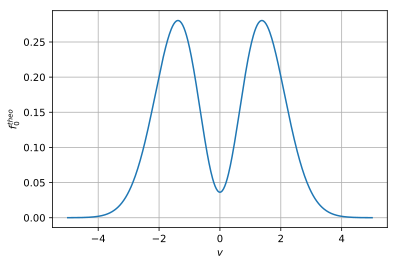

In [151]:
def f0_theo(v):
    W = v**2/2
    r = 1/np.sqrt(2*np.pi)/vth * (2-2*xi)/(3-2*xi) * (1+W/(1-xi)) * np.exp(-W)
    return r
plt.plot(v,f0_theo(v))
plt.ylabel(r'$f_0^{theo}$')
plt.xlabel(r'$v$')
plt.grid()
plt.show()

## simulation results

In [133]:
progesses = np.arange(0,data_num,1)

f = []
phi = []

for progess in progesses:
    f_temp = np.loadtxt(os.path.join(path,"data"+str(progess)))
    f.append(f_temp)
    phi_temp = np.loadtxt(os.path.join(path,"phi"+str(progess)))
    phi.append(phi_temp)

In [135]:
fig = plt.figure(figsize=(12, 8))

Z = f[500]
fv = np.sum(Z, axis=0)*dx/L
Z_phi = phi[500]

ax1 = plt.subplot2grid((2, 3), (0, 0), colspan=2)
ax1.contourf(X, V, Z, levels=15,cmap=cm.plasma)
#ax1.imshow(Z.T,interpolation='spline36',aspect='auto',cmap=cm.plasma)
#ax1.set_xticks(np.arange(0,nx,10),np.arange(0,L,10))
ax1.set_xlabel(r'$x$')
ax1.set_ylabel(r'$v$')

ax2 = plt.subplot2grid((2, 3), (0, 2))
ax2.plot(v, fv, color='red')
ax2.set_xlabel(r'$v$')
ax2.set_ylabel(r'$f_{v}$')
ax2.set_yscale('log')
ax2.grid()

ax3 = plt.subplot2grid((2, 3), (1, 0), colspan=2)
ax3.plot(x, Z_phi, color='blue')
ax3.set_xlabel(r'$x$')
ax3.set_ylabel(r'$\phi$')
ax3.grid()

title_text = "L= " + str(round(L,2)) + r"$; k= $" + str(k) + r"$; \xi= $" + str(xi) + r"$; \Delta= $" + str(d) + "; Time= " + str(int(dt*max_steps))
fig.suptitle(title_text, va='bottom')
plt.tight_layout()
plt.show()

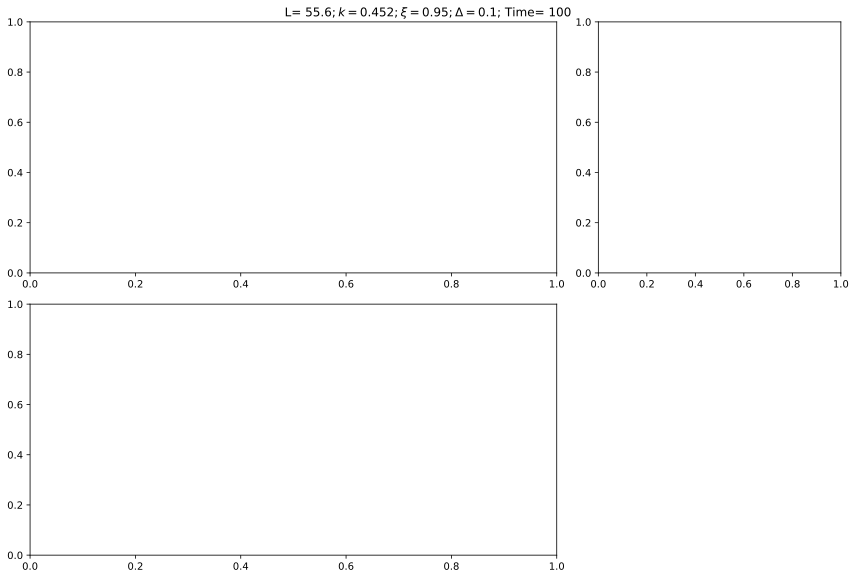

In [144]:
fig = plt.figure(figsize=(12, 8))
fig.set_tight_layout(True)
writer = FFMpegFileWriter(fps=24,bitrate=-1,codec="libx264")
with writer.saving(fig,"BGK-holes-coalescence-vlasov.mp4",dpi=300):
    for frame in range(data_num):
        Z = f[frame]
        fv = np.sum(Z, axis=0)*dx/L
        Z_phi = phi[frame]

        ax1 = plt.subplot2grid((2, 3), (0, 0), colspan=2)
        ax1.contourf(X, V, Z, levels=15,cmap=cm.plasma)
        ax1.set_xlabel(r'$x$')
        ax1.set_ylabel(r'$v$')

        ax2 = plt.subplot2grid((2, 3), (0, 2))
        ax2.plot(v, fv, color='red')
        ax2.set_xlabel(r'$v$')
        ax2.set_ylabel(r'$f_{v}$')
        ax2.set_ylim(0.0005,1)
        ax2.set_yscale('log')
        ax2.grid()

        ax3 = plt.subplot2grid((2, 3), (1, 0), colspan=2)
        ax3.plot(x, Z_phi, color='blue')
        ax3.set_ylim(0,4)
        ax3.set_xlabel(r'$x$')
        ax3.set_ylabel(r'$\phi$')
        ax3.grid()

        title_text = "L= " + str(round(L,2)) + r"$; k= $" + str(k) + r"$; \xi= $" + str(xi) + r"$; \Delta= $" + str(d) + "; Time= " + str(int(dt*max_steps))
        fig.suptitle(title_text, va='bottom')
        #plt.tight_layout()
        writer.grab_frame()
        ax1.cla()
        ax2.cla()
        ax3.cla()